# Data Analytics and Supervised Modeling to predict overdue customers for credit card approval

by Rituparna Basu, Nov 2022

#### Context:
Banks or any financial instituitions contribute to the economic growth in a society. There are different types of lending products banks can offer to their customers. Credit card is one of the key products that almost all banks offer to their customers. Hence, they also face the biggest risk of lending related to this product. To mitigate the risk, they ought to critically assess the eligibility and credit worthiness of the customers before granting a credit card. Background check for customers are performed to check on their eligibilty.  This involves verification, validation and approval to complete the entire process to ensure approval of credit worthy customers only. However, due to availability of large amount of data and number of applicants, it is a labor and time intensive process. This is an area where data analytics and data science can significantly help in the screening process for fast and effective screening.  

#### Objective:
Credit card application is a process, wherein the customers fill in their personal information in the application form for the bank. This, in addition to the background check data is then to be reviewd, analysed and verified to determine the eligibility criteria for an approval.

The objective for this project is to perform analytics and apply different supervised machine learning algorithms to a large dataset received on customer background and credit repayment information to build various classification models. Models aiming to predict the accuracy and evaluating the credit risk can help eliminate some of the risks associated with granting a credit card approval. 

“1” in the target variables should be considered as “risky” and “0” will represent “Not risky”.


## Data Description

Detailed data dictionary is given below.

 ID: Client number                 
 CODE_GENDER: Gender      
 FLAG_OWN_CAR: Is there a car          
 FLAG_OWN_REALTY: Is there a property       
 CNT_CHILDREN: Number of children           
 AMT_INCOME_TOTAL: Annual income     
 NAME_INCOME_TYPE: Income category      
 NAME_EDUCATION_TYPE: Education level    
 NAME_FAMILY_STATUS: Marital status   
 NAME_HOUSING_TYPE: Way of living
 DAYS_BIRTH: Birthday	(Count backwards from current day (0), -1 means yesterday)          
 DAYS_EMPLOYED: Start date of employment (Count backwards from current day(0). If positive, it means the person currently unemployed.)         
 FLAG_MOBIL: Is there a mobile phone             
 FLAG_WORK_PHONE: Is there a work phone        
 FLAG_PHONE: Is there a phone             
 FLAG_EMAIL: Is there an email           
 OCCUPATION_TYPE: Occupation      
 CNT_FAM_MEMBERS: Family size      
 MONTHS_BALANCE: Record month	The month of the extracted data is the starting point, backwards, 0 is the current month, -1 is the previous month, and so on       
 STATUS: Status	(0: 1-29 days past due 1: 30-59 days past due 2: 60-89 days overdue 3: 90-119 days overdue 4: 120-149 days overdue 5: Overdue or bad debts, write-offs for more than 150 days C: paid off that month X: No loan for the month)              

## Importing libraries

In [1]:
# Set up environment

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.pandas.set_option('display.max_columns',None)
import datetime
from datetime import timedelta
import seaborn as sns
from scipy import stats

import itertools

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# Libtune to tune model, get different metric scores
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV

# To help with model building
from sklearn import ensemble
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier

# Library to suppress warnings or deprecation notes 
import warnings
warnings.filterwarnings('ignore')


## Loading Data

In [2]:
# Read in the data

appdf = pd.read_csv("application_record.csv")


In [3]:
#let's see feature size
appdf.shape

(438557, 18)

In [4]:
# Read in the data

cdf = pd.read_csv("credit_record.csv")

In [5]:
#let's see feature size
cdf.shape

(1048575, 3)

In [6]:
#  Now,we have two types of data, so we have to merge the Data.

df = appdf.merge(cdf,how='inner',on=['ID'])

In [7]:
#let's see feature size for the combined data
df.shape

(777715, 20)

## Data Overview

- Observations
- Sanity checks

In [8]:
print(f'There are {df.shape[0]} rows and {df.shape[1]} columns.')  # f-string
df.head(5) 

There are 777715 rows and 20 columns.


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,MONTHS_BALANCE,STATUS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0,C
1,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,-1,C
2,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,-2,C
3,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,-3,C
4,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,-4,C


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 777715 entries, 0 to 777714
Data columns (total 20 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   777715 non-null  int64  
 1   CODE_GENDER          777715 non-null  object 
 2   FLAG_OWN_CAR         777715 non-null  object 
 3   FLAG_OWN_REALTY      777715 non-null  object 
 4   CNT_CHILDREN         777715 non-null  int64  
 5   AMT_INCOME_TOTAL     777715 non-null  float64
 6   NAME_INCOME_TYPE     777715 non-null  object 
 7   NAME_EDUCATION_TYPE  777715 non-null  object 
 8   NAME_FAMILY_STATUS   777715 non-null  object 
 9   NAME_HOUSING_TYPE    777715 non-null  object 
 10  DAYS_BIRTH           777715 non-null  int64  
 11  DAYS_EMPLOYED        777715 non-null  int64  
 12  FLAG_MOBIL           777715 non-null  int64  
 13  FLAG_WORK_PHONE      777715 non-null  int64  
 14  FLAG_PHONE           777715 non-null  int64  
 15  FLAG_EMAIL       

## Data cleaning
* Check duplicate value
* Check missing value
* Deal with missing value
* Drop unnecessary columns
* Check data type of all columns

In [10]:
duplicate = df[df.duplicated()]
# duplicate=df.duplicated(subset=None, keep='first')
duplicate

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,MONTHS_BALANCE,STATUS


* No duplicated row.

In [11]:
df.describe()

,ID,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,MONTHS_BALANCE
count,7.777150e+05,777715.000000,7.777150e+05,777715.000000,777715.000000,777715.0,777715.000000,777715.000000,777715.000000,777715.000000,777715.000000
mean,5.078743e+06,0.428082,1.885348e+05,-16124.937046,57775.825016,1.0,0.231818,0.300965,0.091675,2.208837,-19.373564
std,4.180442e+04,0.745755,1.016225e+05,4104.304018,136471.735391,0.0,0.421993,0.458678,0.288567,0.907380,14.082208
min,5.008804e+06,0.000000,2.700000e+04,-25152.000000,-15713.000000,1.0,0.000000,0.000000,0.000000,1.000000,-60.000000
25%,5.044568e+06,0.000000,1.215000e+05,-19453.000000,-3292.000000,1.0,0.000000,0.000000,0.000000,2.000000,-29.000000
50%,5.069530e+06,0.000000,1.620000e+05,-15760.000000,-1682.000000,1.0,0.000000,0.000000,0.000000,2.000000,-17.000000
75%,5.115551e+06,1.000000,2.250000e+05,-12716.000000,-431.000000,1.0,0.000000,1.000000,0.000000,3.000000,-8.000000
max,5.150487e+06,19.000000,1.575000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000,0.000000


In [12]:
# Find the missing values for each variable.

df.isnull().sum().sort_values(ascending=False)

OCCUPATION_TYPE        240048
ID                          0
CODE_GENDER                 0
MONTHS_BALANCE              0
CNT_FAM_MEMBERS             0
FLAG_EMAIL                  0
FLAG_PHONE                  0
FLAG_WORK_PHONE             0
FLAG_MOBIL                  0
DAYS_EMPLOYED               0
DAYS_BIRTH                  0
NAME_HOUSING_TYPE           0
NAME_FAMILY_STATUS          0
NAME_EDUCATION_TYPE         0
NAME_INCOME_TYPE            0
AMT_INCOME_TOTAL            0
CNT_CHILDREN                0
FLAG_OWN_REALTY             0
FLAG_OWN_CAR                0
STATUS                      0
dtype: int64

* The occupation column has null data

In [13]:
# Find Unique values

df.nunique()

ID                     36457
CODE_GENDER                2
FLAG_OWN_CAR               2
FLAG_OWN_REALTY            2
CNT_CHILDREN               9
AMT_INCOME_TOTAL         265
NAME_INCOME_TYPE           5
NAME_EDUCATION_TYPE        5
NAME_FAMILY_STATUS         5
NAME_HOUSING_TYPE          6
DAYS_BIRTH              7183
DAYS_EMPLOYED           3640
FLAG_MOBIL                 1
FLAG_WORK_PHONE            2
FLAG_PHONE                 2
FLAG_EMAIL                 2
OCCUPATION_TYPE           18
CNT_FAM_MEMBERS           10
MONTHS_BALANCE            61
STATUS                     8
dtype: int64

In [14]:
backup = df.copy()

In [15]:
df['OCCUPATION_TYPE'].value_counts()

Laborers                 131572
Core staff                77112
Sales staff               70362
Managers                  67738
Drivers                   47678
High skill tech staff     31768
Accountants               27223
Medicine staff            26691
Cooking staff             13416
Security staff            12400
Cleaning staff            11399
Private service staff      6714
Low-skill Laborers         3623
Secretaries                3149
Waiters/barmen staff       2557
HR staff                   1686
IT staff                   1319
Realty agents              1260
Name: OCCUPATION_TYPE, dtype: int64

In [16]:
# Filling in the missing values in a categorical variable (Occupation) with Unknown

df['OCCUPATION_TYPE'].fillna('Unknown',inplace=True)

In [17]:
df['OCCUPATION_TYPE'].value_counts()

Unknown                  240048
Laborers                 131572
Core staff                77112
Sales staff               70362
Managers                  67738
Drivers                   47678
High skill tech staff     31768
Accountants               27223
Medicine staff            26691
Cooking staff             13416
Security staff            12400
Cleaning staff            11399
Private service staff      6714
Low-skill Laborers         3623
Secretaries                3149
Waiters/barmen staff       2557
HR staff                   1686
IT staff                   1319
Realty agents              1260
Name: OCCUPATION_TYPE, dtype: int64

In [18]:
df1 = df.copy()

In [19]:
# Rename the existing DataFrame (rather than creating a copy) 
df1.rename(columns={'CODE_GENDER': 'GENDER', 'FLAG_OWN_CAR': 'OWNCAR','FLAG_OWN_REALTY': 'OWNREALTY',
                    'CNT_CHILDREN': 'CHILDREN', 'AMT_INCOME_TOTAL': 'INCOME','NAME_INCOME_TYPE': 'INCOMETYPE',
                    'NAME_EDUCATION_TYPE': 'EDUCATION',  'NAME_FAMILY_STATUS': 'FAMILYSTATUS','NAME_HOUSING_TYPE': 'HOUSINGTYPE',
                   'DAYS_BIRTH': 'AGEDAYS', 'DAYS_EMPLOYED': 'DAYSEMPLD','FLAG_MOBIL': 'CELLPH',
                    'FLAG_WORK_PHONE': 'WORKPH', 'FLAG_PHONE': 'PHONE','FLAG_EMAIL': 'EMAIL',
                    'OCCUPATION_TYPE': 'OCCUPATION',  'CNT_FAM_MEMBERS': 'FAMILYMEM','MONTHS_BALANCE': 'MTHBALANCE'}, inplace=True)

###  Lets check the entries in the features

In [20]:
df1.head()

,ID,GENDER,OWNCAR,OWNREALTY,CHILDREN,INCOME,INCOMETYPE,EDUCATION,FAMILYSTATUS,HOUSINGTYPE,AGEDAYS,DAYSEMPLD,CELLPH,WORKPH,PHONE,EMAIL,OCCUPATION,FAMILYMEM,MTHBALANCE,STATUS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Unknown,2.0,0,C
1,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Unknown,2.0,-1,C
2,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Unknown,2.0,-2,C
3,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Unknown,2.0,-3,C
4,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Unknown,2.0,-4,C


In [21]:
# Convert negative values to positive
df1['AGEDAYS'] = df1['AGEDAYS'].apply(lambda x: abs(x) if x < 0 else x)

In [22]:
# Convert negative values to positive
df1['DAYSEMPLD'] = df1['DAYSEMPLD'].apply(lambda x: abs(x) if x < 0 else x)

In [23]:
# Convert negative values to positive
df1['MTHBALANCE'] = df1['MTHBALANCE'].apply(lambda x: abs(x) if x < 0 else x)

In [24]:
df1['GENDER'].value_counts()

F    518851
M    258864
Name: GENDER, dtype: int64

In [25]:
df1['OWNCAR'].value_counts()

N    473355
Y    304360
Name: OWNCAR, dtype: int64

In [26]:
df1['OWNREALTY'].value_counts()

Y    512948
N    264767
Name: OWNREALTY, dtype: int64

In [27]:
df1['INCOMETYPE'].value_counts()

Working                 400164
Commercial associate    183385
Pensioner               128392
State servant            65437
Student                    337
Name: INCOMETYPE, dtype: int64

In [28]:
df1['EDUCATION'].value_counts()

Secondary / secondary special    524261
Higher education                 213633
Incomplete higher                 30329
Lower secondary                    8655
Academic degree                     837
Name: EDUCATION, dtype: int64

In [29]:
def education(x):
    if x=='Secondary / secondary special':
        x=x.split(' / ')[0]
    return x

df1['EDUCATION']=df1['EDUCATION'].apply(education)

df1['EDUCATION'].value_counts()

Secondary            524261
Higher education     213633
Incomplete higher     30329
Lower secondary        8655
Academic degree         837
Name: EDUCATION, dtype: int64

In [30]:
df1['FAMILYSTATUS'].value_counts()

Married                 546619
Single / not married     94335
Civil marriage           60342
Separated                45255
Widow                    31164
Name: FAMILYSTATUS, dtype: int64

In [31]:
def fun(x):
    if x=='Single / not married':
        x=x.split(' / ')[0]
    return x

df1['FAMILYSTATUS']=df1['FAMILYSTATUS'].apply(fun)

df1['FAMILYSTATUS'].value_counts()

Married           546619
Single             94335
Civil marriage     60342
Separated          45255
Widow              31164
Name: FAMILYSTATUS, dtype: int64

In [32]:
df1['OWNREALTY'].value_counts()

Y    512948
N    264767
Name: OWNREALTY, dtype: int64

In [33]:
df1['HOUSINGTYPE'].value_counts()

House / apartment      697151
With parents            35735
Municipal apartment     24640
Rented apartment        10898
Office apartment         5636
Co-op apartment          3655
Name: HOUSINGTYPE, dtype: int64

In [34]:
df1['OCCUPATION'].value_counts()

Unknown                  240048
Laborers                 131572
Core staff                77112
Sales staff               70362
Managers                  67738
Drivers                   47678
High skill tech staff     31768
Accountants               27223
Medicine staff            26691
Cooking staff             13416
Security staff            12400
Cleaning staff            11399
Private service staff      6714
Low-skill Laborers         3623
Secretaries                3149
Waiters/barmen staff       2557
HR staff                   1686
IT staff                   1319
Realty agents              1260
Name: OCCUPATION, dtype: int64

In [35]:
df1['STATUS'].value_counts()

C    329536
0    290654
X    145950
1      8747
5      1527
2       801
3       286
4       214
Name: STATUS, dtype: int64

In [36]:
df1.loc[df1['STATUS']=='C','STATUS']=6
df1.loc[df1['STATUS']=='X','STATUS']=7

In [37]:
df1['STATUS']=df1['STATUS'].astype(float)

In [38]:
def solve(criteria):
    risk =''
    if criteria in (2,3,4,5):
        risk=1 #Risky
    else :
        risk=0 #not Risky
        
    return risk

In [39]:
df1['risk']=df1['STATUS'].apply(solve)

In [40]:
#df1['risk'] = pd.Categorical(df1['risk']) - Alternate method of datatype change

df1['risk'] = df1['risk'].astype('category')

In [41]:
df1.dtypes

ID                 int64
GENDER            object
OWNCAR            object
OWNREALTY         object
CHILDREN           int64
INCOME           float64
INCOMETYPE        object
EDUCATION         object
FAMILYSTATUS      object
HOUSINGTYPE       object
AGEDAYS            int64
DAYSEMPLD          int64
CELLPH             int64
WORKPH             int64
PHONE              int64
EMAIL              int64
OCCUPATION        object
FAMILYMEM        float64
MTHBALANCE         int64
STATUS           float64
risk            category
dtype: object

In [42]:
df1['risk'].value_counts()

0    774887
1      2828
Name: risk, dtype: int64

In [43]:
df1['WORKPH'].value_counts()

0    597427
1    180288
Name: WORKPH, dtype: int64

In [44]:
df1['EMAIL'].value_counts()

0    706418
1     71297
Name: EMAIL, dtype: int64

In [45]:
df1['CELLPH'].value_counts()

1    777715
Name: CELLPH, dtype: int64

In [46]:
# Everyone has cell ph so we can drop it.
df1= df1.drop(columns=['CELLPH'])

# Outlier Detection

### The data is big so it slows down the notebook signficantly. To handle that issue, a sample dataset is created to check outliers.

In [47]:
df_small = df1.copy()

In [48]:
df_small=df_small.sample(n=100000, random_state=123)

In [49]:
df_small.shape

(100000, 20)

In [50]:
df_small.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 719873 to 124923
Data columns (total 20 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   ID            100000 non-null  int64   
 1   GENDER        100000 non-null  object  
 2   OWNCAR        100000 non-null  object  
 3   OWNREALTY     100000 non-null  object  
 4   CHILDREN      100000 non-null  int64   
 5   INCOME        100000 non-null  float64 
 6   INCOMETYPE    100000 non-null  object  
 7   EDUCATION     100000 non-null  object  
 8   FAMILYSTATUS  100000 non-null  object  
 9   HOUSINGTYPE   100000 non-null  object  
 10  AGEDAYS       100000 non-null  int64   
 11  DAYSEMPLD     100000 non-null  int64   
 12  WORKPH        100000 non-null  int64   
 13  PHONE         100000 non-null  int64   
 14  EMAIL         100000 non-null  int64   
 15  OCCUPATION    100000 non-null  object  
 16  FAMILYMEM     100000 non-null  float64 
 17  MTHBALANCE    100000 non

In [51]:
df_small1 = df_small.copy()

## Lets check if the sampled dataset is reresentative of the original dataset. 

* Will create a correlation matrix for both the original and sample dataset

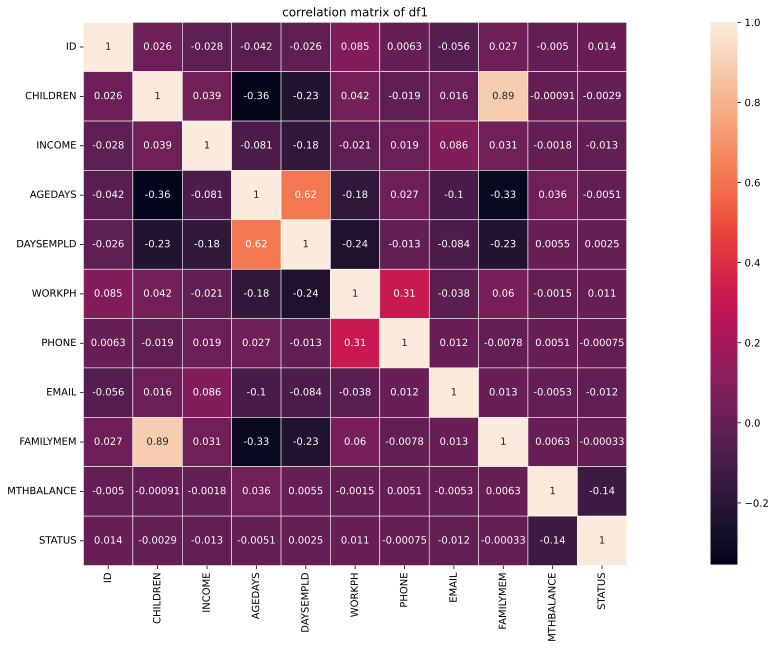

In [52]:
## Correlation matrix of the orginal dataset

corrmat_df1 = df1.corr()

plt.figure(figsize=(30,10))
sns.heatmap(corrmat_df1, square=True, annot=True, linewidths=0.5)
plt.title("correlation matrix of df1")

plt.show()

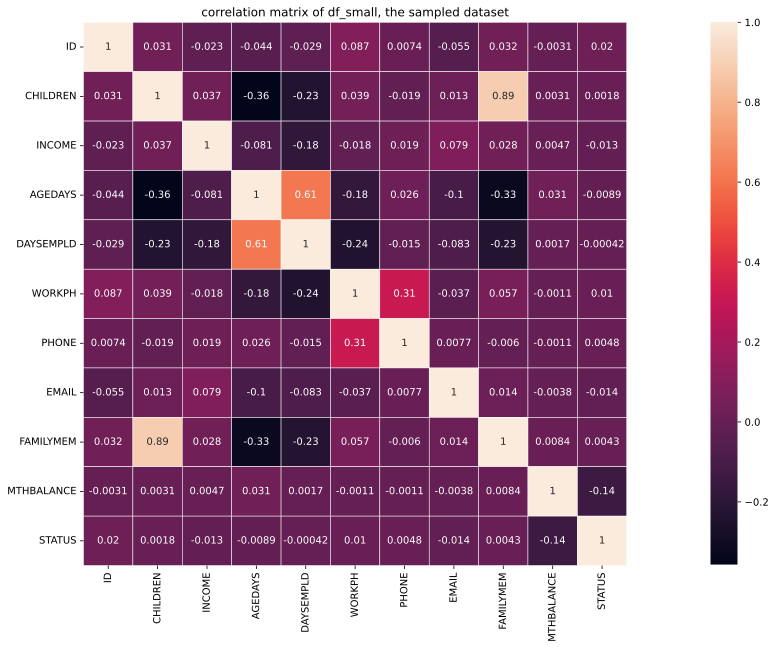

In [53]:
## Correlation matrix of the small sampled dataset

corrmat_df_small = df_small.corr()

plt.figure(figsize=(30,10))
sns.heatmap(corrmat_df_small, square=True, annot=True, linewidths=0.5)
plt.title("correlation matrix of df_small, the sampled dataset")

plt.show()

#### Both the correlation matrices are similar so both the datas are comparable.

Text(0.5, 1.0, 'Number of CHILDREN')

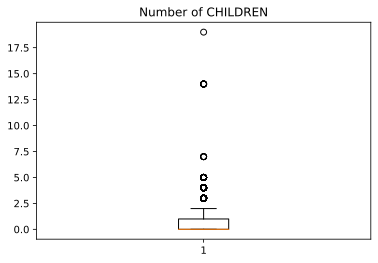

In [54]:
plt.boxplot(df_small["CHILDREN"], whis = 1.5)
plt.title("Number of CHILDREN")


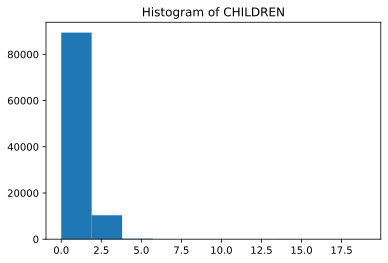

In [55]:
plt.hist(df_small["CHILDREN"])
plt.title("Histogram of CHILDREN")
plt.show()

Text(0.5, 1.0, 'INCOME')

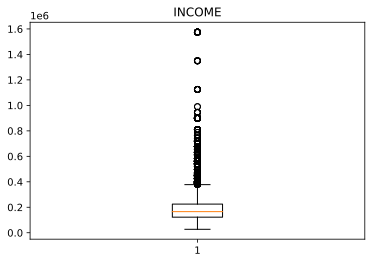

In [56]:
plt.boxplot(df_small["INCOME"], whis = 1.5)
plt.title("INCOME")

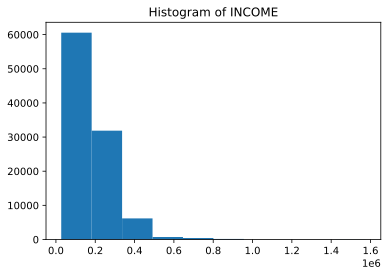

In [57]:
plt.hist(df_small["INCOME"])
plt.title("Histogram of INCOME")
plt.show()

Text(0.5, 1.0, 'AGE DAYS')

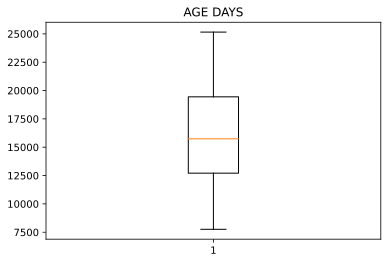

In [58]:
plt.boxplot(df_small["AGEDAYS"], whis = 1.5)
plt.title("AGE DAYS")

Text(0.5, 1.0, 'DAYS EMPLOYED')

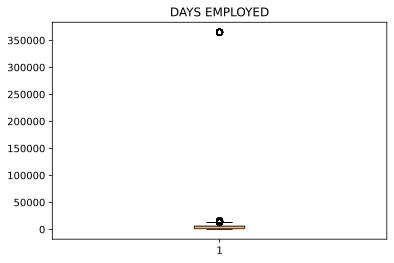

In [59]:
plt.boxplot(df_small["DAYSEMPLD"], whis = 1.5)
plt.title("DAYS EMPLOYED")

Text(0.5, 1.0, 'NUMBER OF FAMILY MEMBERS')

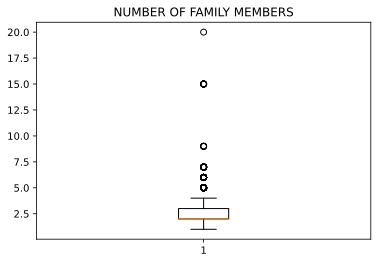

In [60]:
plt.boxplot(df_small["FAMILYMEM"], whis = 1.5)
plt.title("NUMBER OF FAMILY MEMBERS")

Text(0.5, 1.0, 'MONTHS OF BALANCE')

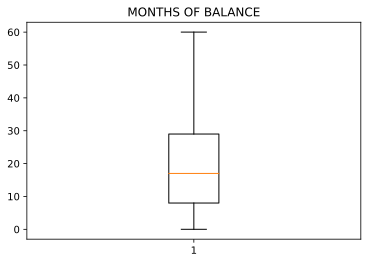

In [61]:
plt.boxplot(df_small["MTHBALANCE"], whis = 1.5)
plt.title("MONTHS OF BALANCE")

In [62]:
from scipy.stats.mstats import winsorize

In [63]:
df_small['win_CHILDREN'] = winsorize(df_small["CHILDREN"], (0.0, 0.0005))

df_small['win_INCOME'] = winsorize(df_small["INCOME"], (0.0, 0.005))

df_small['win_DAYSEMPLD'] = winsorize(df_small["DAYSEMPLD"], (0.04, 0.18))

df_small['win_FAMILYMEM'] = winsorize(df_small["FAMILYMEM"], (0.0, 0.001))

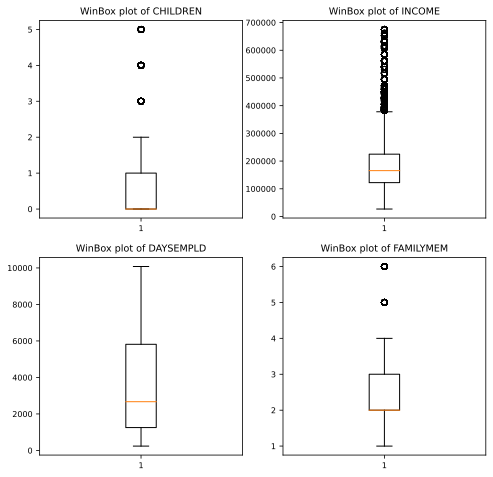

In [64]:
# Visualize the winsorized data using a box plot

plt.figure(figsize = (8,8))
plt.rcParams['font.size'] = 8

plt.subplot(2,2,1)
plt.boxplot(df_small['win_CHILDREN'])
plt.title("WinBox plot of CHILDREN")

plt.subplot(2,2,2)
plt.boxplot(df_small['win_INCOME'])
plt.title("WinBox plot of INCOME")

plt.subplot(2,2,3)
plt.boxplot(df_small['win_DAYSEMPLD'])
plt.title("WinBox plot of DAYSEMPLD")

plt.subplot(2,2,4)
plt.boxplot(df_small['win_FAMILYMEM'])
plt.title("WinBox plot of FAMILYMEM")

plt.show()

In [65]:
df_small2= df_small.drop(columns=['CHILDREN', 'INCOME', 'DAYSEMPLD', 'FAMILYMEM'])

In [66]:
df_small2.head()

,ID,GENDER,OWNCAR,OWNREALTY,INCOMETYPE,EDUCATION,FAMILYSTATUS,HOUSINGTYPE,AGEDAYS,WORKPH,PHONE,EMAIL,OCCUPATION,MTHBALANCE,STATUS,risk,win_CHILDREN,win_INCOME,win_DAYSEMPLD,win_FAMILYMEM
719873,5143055,M,N,N,Commercial associate,Secondary,Married,House / apartment,14070,1,1,0,Laborers,2,6.0,0,0,180000.0,1565,2.0
309206,5061320,F,Y,Y,State servant,Higher education,Married,House / apartment,15050,0,0,0,Managers,15,7.0,0,1,261000.0,1628,3.0
121103,5028731,M,N,Y,Commercial associate,Secondary,Married,House / apartment,12483,0,0,0,Managers,3,6.0,0,0,360000.0,4039,2.0
106676,5025115,F,Y,Y,Commercial associate,Secondary,Married,House / apartment,17103,0,0,0,Cooking staff,22,6.0,0,0,360000.0,1493,2.0
657943,5126252,F,N,N,Working,Secondary,Separated,House / apartment,20062,1,0,0,Cleaning staff,33,0.0,0,0,216000.0,561,1.0


## Lets check how the dataset compares before and after winsorization

In [67]:
# Dataset before winsorization
df_small1.describe()

,ID,CHILDREN,INCOME,AGEDAYS,DAYSEMPLD,WORKPH,PHONE,EMAIL,FAMILYMEM,MTHBALANCE,STATUS
count,1.000000e+05,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.00000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000
mean,5.078666e+06,0.430350,1.887174e+05,16115.273650,62118.494520,0.23007,0.300220,0.09162,2.210920,19.397000,3.892740
std,4.175543e+04,0.743259,1.016335e+05,4098.947673,134130.087665,0.42088,0.458356,0.28849,0.905528,14.065084,3.071428
min,5.008805e+06,0.000000,2.700000e+04,7757.000000,17.000000,0.00000,0.000000,0.00000,1.000000,0.000000,0.000000
25%,5.042356e+06,0.000000,1.224000e+05,12709.000000,1254.000000,0.00000,0.000000,0.00000,2.000000,8.000000,0.000000
50%,5.069504e+06,0.000000,1.656000e+05,15737.000000,2670.000000,0.00000,0.000000,0.00000,2.000000,17.000000,6.000000
75%,5.115484e+06,1.000000,2.250000e+05,19444.000000,5817.000000,0.00000,1.000000,0.00000,3.000000,29.000000,6.000000
max,5.150487e+06,19.000000,1.575000e+06,25152.000000,365243.000000,1.00000,1.000000,1.00000,20.000000,60.000000,7.000000


In [68]:
# Dataset after winsorization
df_small2.describe()

,ID,AGEDAYS,WORKPH,PHONE,EMAIL,MTHBALANCE,STATUS,win_CHILDREN,win_INCOME,win_DAYSEMPLD,win_FAMILYMEM
count,1.000000e+05,100000.000000,100000.00000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,5.078666e+06,16115.273650,0.23007,0.300220,0.09162,19.397000,3.892740,0.429300,188004.551490,3951.412170,2.209440
std,4.175543e+04,4098.947673,0.42088,0.458356,0.28849,14.065084,3.071428,0.730333,96443.971198,3427.731318,0.893691
min,5.008805e+06,7757.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,27000.000000,239.000000,1.000000
25%,5.042356e+06,12709.000000,0.00000,0.000000,0.00000,8.000000,0.000000,0.000000,122400.000000,1254.000000,2.000000
50%,5.069504e+06,15737.000000,0.00000,0.000000,0.00000,17.000000,6.000000,0.000000,165600.000000,2670.000000,2.000000
75%,5.115484e+06,19444.000000,0.00000,1.000000,0.00000,29.000000,6.000000,1.000000,225000.000000,5817.000000,3.000000
max,5.150487e+06,25152.000000,1.00000,1.000000,1.00000,60.000000,7.000000,5.000000,675000.000000,10079.000000,6.000000


** Both the datasets have comparable means.

In [69]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [70]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=8,
            xytext=(0, 3),
            textcoords="offset points",
        )  # annotate the percentage
        
    # Adjust the font size of the tick labels
        ax.tick_params(labelsize=8)
   

    plt.show()  # show the plot

In [71]:
# function to plot stacked bar chart


def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left",
        frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [72]:
print(f' Mean DAYSEMPLD {df_small1.DAYSEMPLD.mean()}, Median {df_small1.DAYSEMPLD.median()}, Minimum {df_small1.DAYSEMPLD.min()}, Maximum {df_small1.DAYSEMPLD.max()}')
histogram_boxplot(df_small1, 'DAYSEMPLD')

 Mean DAYSEMPLD 62118.49452, Median 2670.0, Minimum 17, Maximum 365243


 Mean DAYSEMPLD 3951.41217, Median 2670.0, Minimum 239, Maximum 10079


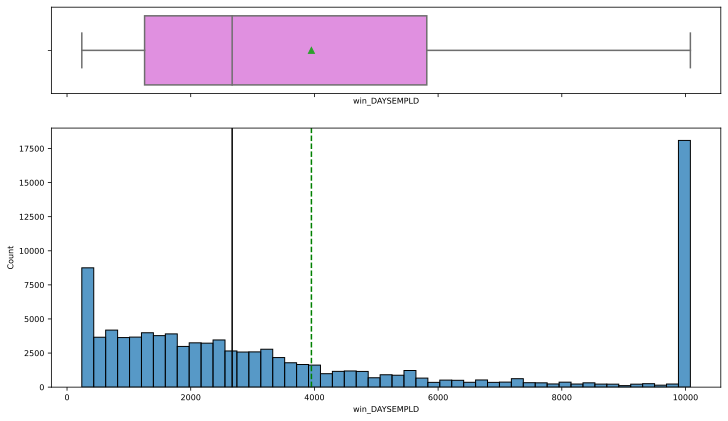

In [73]:
print(f' Mean DAYSEMPLD {df_small2.win_DAYSEMPLD.mean()}, Median {df_small2.win_DAYSEMPLD.median()}, Minimum {df_small2.win_DAYSEMPLD.min()}, Maximum {df_small2.win_DAYSEMPLD.max()}')
histogram_boxplot(df_small2, 'win_DAYSEMPLD')

 Mean INCOME 188717.43384, Median 165600.0, Minimum 27000.0, Maximum 1575000.0


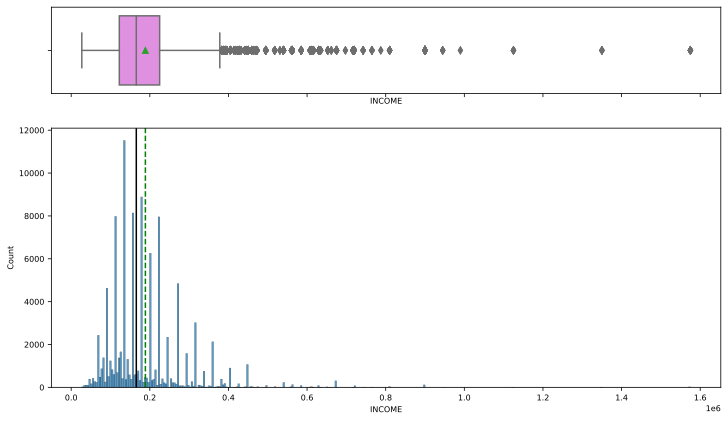

In [74]:
print(f' Mean INCOME {df_small1.INCOME.mean()}, Median {df_small1.INCOME.median()}, Minimum {df_small1.INCOME.min()}, Maximum {df_small1.INCOME.max()}')
histogram_boxplot(df_small1, 'INCOME')

 Mean win_INCOME 188004.55149, Median 165600.0, Minimum 27000.0, Maximum 675000.0


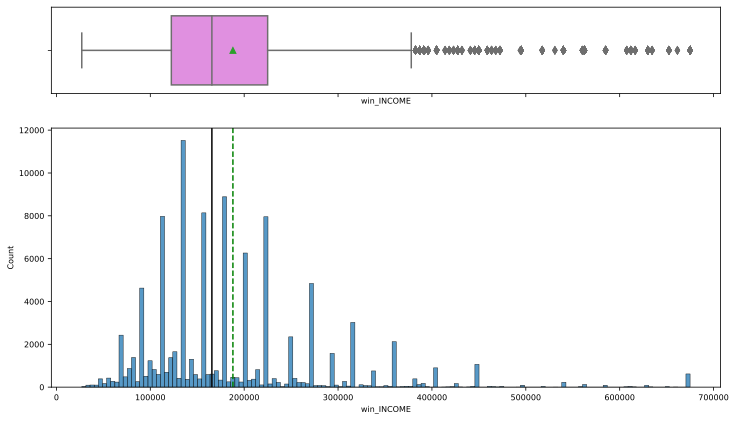

In [75]:
print(f' Mean win_INCOME {df_small2.win_INCOME.mean()}, Median {df_small2.win_INCOME.median()}, Minimum {df_small2.win_INCOME.min()}, Maximum {df_small2.win_INCOME.max()}')
histogram_boxplot(df_small2, 'win_INCOME')

** By comparing data before and after  winsorization we see that the median are same and majority of the data is comparable.

### Creating two data frames for the non-risk and risk sets risk=0 and 1, from the *non winsorized* dataset 

In [76]:
# Creating a new dataframe with TARGET value

df_nr = df_small[df_small['risk'] == 0]
df_r= df_small[df_small['risk'] == 1]

### Creating two data frames for the non-risk and risk sets risk=0 and 1, from the *winsorized* dataset 

In [77]:
# Creating a new dataframe with TARGET value

df_nr2 = df_small2[df_small['risk'] == 0]
df_r2= df_small2[df_small['risk'] == 1]

## Exploratory Data Analysis (EDA)

### Univariate Data Analysis

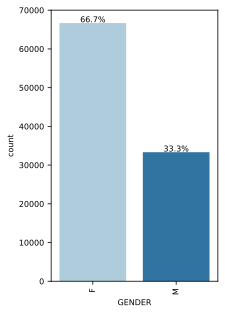

In [78]:
labeled_barplot(df_small2, "GENDER", perc=True)

** Distribution of Gender shows 67% are females and 33% are males

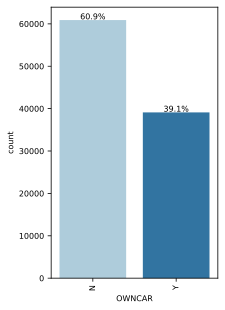

In [79]:
labeled_barplot(df_small2, "OWNCAR", perc=True)

** Distribution shows 61% own a car and 39% do not.

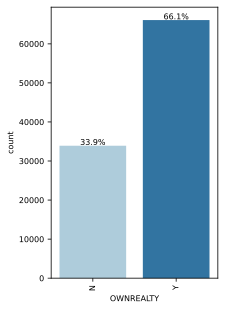

In [80]:
labeled_barplot(df_small2, "OWNREALTY", perc=True)

** Distribution shows 67% own a realty and 34% do not.

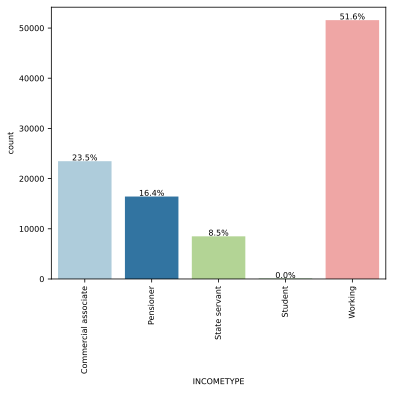

In [81]:
labeled_barplot(df_small2, "INCOMETYPE", perc=True)

** No of Customers by Income Type: 52% are working, 24% are commercial associates, 16% are pensioner and 9% State servant.

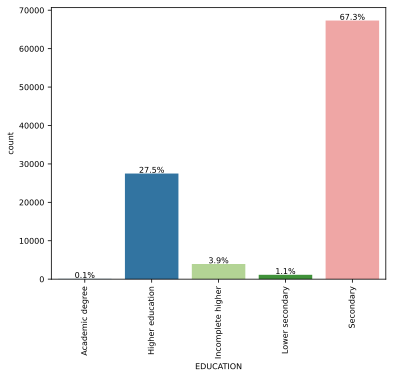

In [82]:
labeled_barplot(df_small2, "EDUCATION", perc=True)

** No of Customers by Education Type: 67% have secondary education, 28% have higher education, 4% have incomplete higher education and 1% have lower secondary education.

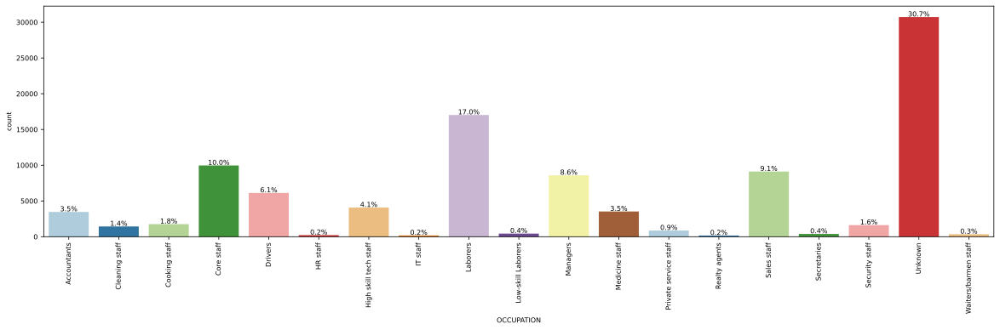

In [83]:
labeled_barplot(df_small2, "OCCUPATION", perc=True)

** Distribution of occupation shows: 31% have missing values (occupation not mentioned), 17% are labors, 10% are core staff, 9% sales staff, 9% are managers, 6% are drivers and 4% are high skill tech staff. 

<AxesSubplot:xlabel='MTHBALANCE', ylabel='risk'>

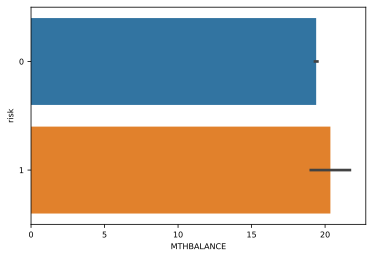

In [84]:
sns.barplot(x="MTHBALANCE", y="risk", data=df_small)

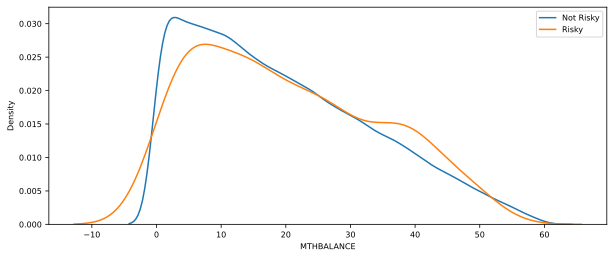

In [85]:
 # Create Plots
plt.figure(figsize=(10, 4))
sns.distplot(df_nr['MTHBALANCE'], label = "Not Risky", hist=False)
sns.distplot(df_r['MTHBALANCE'], label = "Risky", hist=False)

plt.ticklabel_format(style='plain', axis='x')
plt.legend()
plt.show()

<AxesSubplot:xlabel='AGEDAYS', ylabel='risk'>

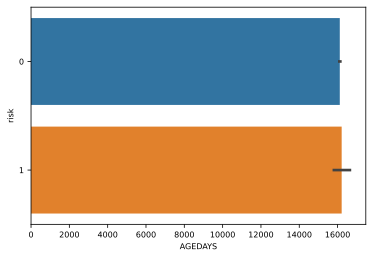

In [86]:
sns.barplot(x=df_small["AGEDAYS"], y="risk", data=df_small)

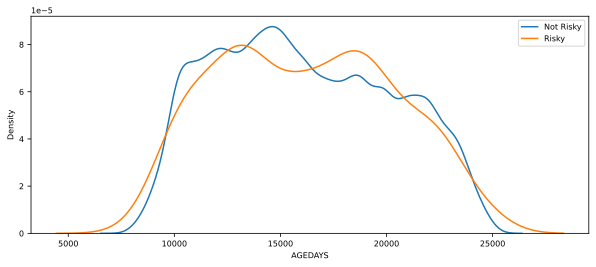

In [87]:
 # Create Plots
plt.figure(figsize=(10, 4))
sns.distplot(df_nr['AGEDAYS'], label = "Not Risky", hist=False)
sns.distplot(df_r['AGEDAYS'], label = "Risky", hist=False)

plt.ticklabel_format(style='plain', axis='x')
plt.legend()
plt.show()

<AxesSubplot:xlabel='INCOME', ylabel='risk'>

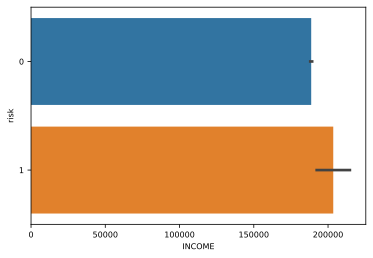

In [88]:
sns.barplot(x=df_small["INCOME"], y="risk", data=df_small)

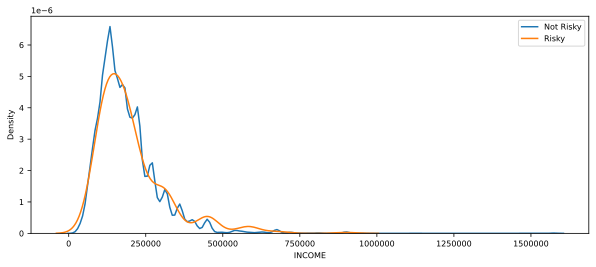

In [89]:
 # Create Plots
plt.figure(figsize=(10, 4))
sns.distplot(df_nr['INCOME'], label = "Not Risky", hist=False)
sns.distplot(df_r['INCOME'], label = "Risky", hist=False)

plt.ticklabel_format(style='plain', axis='x')
plt.legend()
plt.show()

<AxesSubplot:xlabel='win_INCOME', ylabel='risk'>

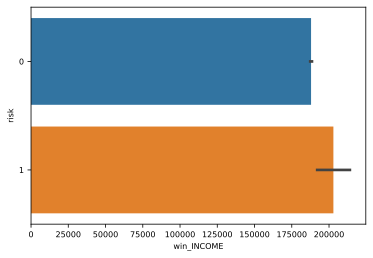

In [90]:
sns.barplot(x=df_small2["win_INCOME"], y="risk", data=df_small)

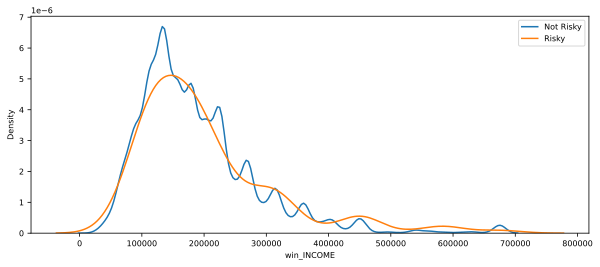

In [91]:
 # Create Plots
plt.figure(figsize=(10, 4))
sns.distplot(df_nr2['win_INCOME'], label = "Not Risky", hist=False)
sns.distplot(df_r2['win_INCOME'], label = "Risky", hist=False)

plt.ticklabel_format(style='plain', axis='x')
plt.legend()
plt.show()

<AxesSubplot:xlabel='DAYSEMPLD', ylabel='risk'>

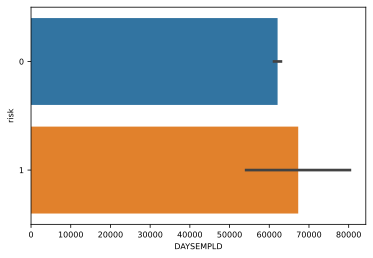

In [92]:
sns.barplot(x=df_small["DAYSEMPLD"], y="risk", data=df_small)

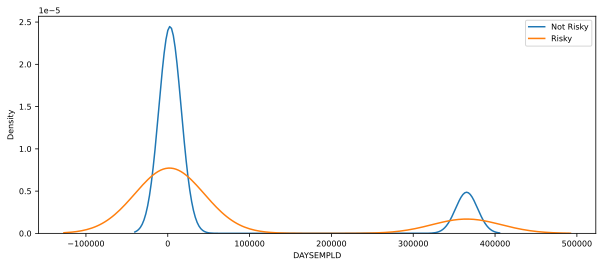

In [93]:
 # Create Plots
plt.figure(figsize=(10, 4))
sns.distplot(df_nr['DAYSEMPLD'], label = "Not Risky", hist=False)
sns.distplot(df_r['DAYSEMPLD'], label = "Risky", hist=False)

plt.ticklabel_format(style='plain', axis='x')
plt.legend()
plt.show()

<AxesSubplot:xlabel='win_DAYSEMPLD', ylabel='risk'>

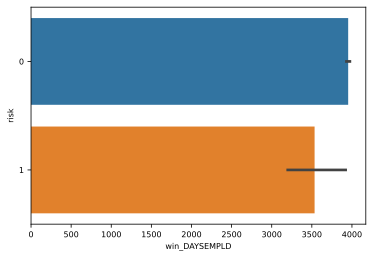

In [94]:
sns.barplot(x=df_small2["win_DAYSEMPLD"], y="risk", data=df_small)

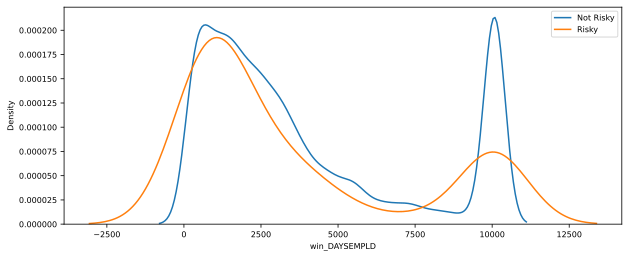

In [95]:
 # Create Plots
plt.figure(figsize=(10, 4))
sns.distplot(df_nr2['win_DAYSEMPLD'], label = "Not Risky", hist=False)
sns.distplot(df_r2['win_DAYSEMPLD'], label = "Risky", hist=False)

plt.ticklabel_format(style='plain', axis='x')
plt.legend()
plt.show()

risk                   0    1     All
EDUCATION                            
All                99610  390  100000
Secondary          67067  244   67311
Higher education   27370  124   27494
Incomplete higher   3922   16    3938
Lower secondary     1133    6    1139
Academic degree      118    0     118
------------------------------------------------------------------------------------------------------------------------


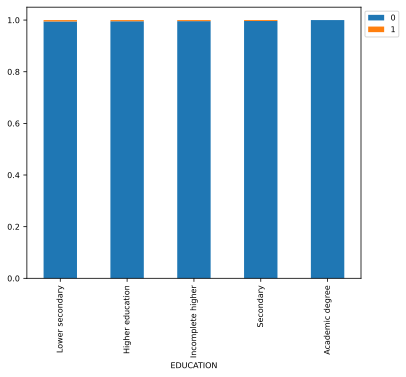

In [96]:
stacked_barplot(df_small, "EDUCATION", "risk")

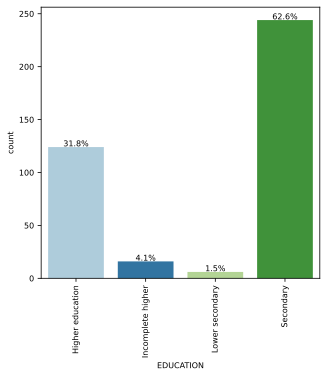

In [97]:
labeled_barplot(df_r, "EDUCATION", perc=True)

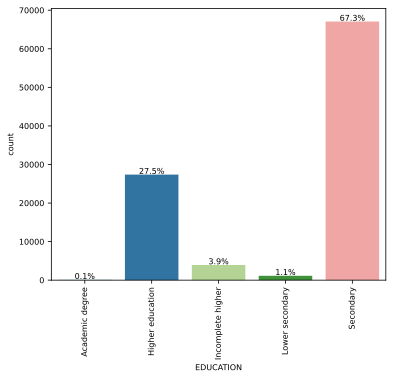

In [98]:
labeled_barplot(df_nr, "EDUCATION", perc=True)

#### We looked at the outliers in the small dataset and performed winsorization on it . Since the small dataset is representative of the original dataset we are now going to apply  the same winsorization to the original dataset.

In [99]:
df2= df1.copy()

In [100]:
df2['win_CHILDREN'] = winsorize(df2["CHILDREN"], (0.0, 0.0005))

df2['win_INCOME'] = winsorize(df2["INCOME"], (0.0, 0.005))

df2['win_DAYSEMPLD'] = winsorize(df2["DAYSEMPLD"], (0.04, 0.18))

df2['win_FAMILYMEM'] = winsorize(df2["FAMILYMEM"], (0.0, 0.001))


In [101]:
df2.head()

,ID,GENDER,OWNCAR,OWNREALTY,CHILDREN,INCOME,INCOMETYPE,EDUCATION,FAMILYSTATUS,HOUSINGTYPE,AGEDAYS,DAYSEMPLD,WORKPH,PHONE,EMAIL,OCCUPATION,FAMILYMEM,MTHBALANCE,STATUS,risk,win_CHILDREN,win_INCOME,win_DAYSEMPLD,win_FAMILYMEM
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,12005,4542,1,0,0,Unknown,2.0,0,6.0,0,0,427500.0,4542,2.0
1,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,12005,4542,1,0,0,Unknown,2.0,1,6.0,0,0,427500.0,4542,2.0
2,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,12005,4542,1,0,0,Unknown,2.0,2,6.0,0,0,427500.0,4542,2.0
3,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,12005,4542,1,0,0,Unknown,2.0,3,6.0,0,0,427500.0,4542,2.0
4,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,12005,4542,1,0,0,Unknown,2.0,4,6.0,0,0,427500.0,4542,2.0


In [102]:
df2= df2.drop(columns=['CHILDREN', 'INCOME', 'DAYSEMPLD', 'FAMILYMEM'])

In [103]:
df2.head()

,ID,GENDER,OWNCAR,OWNREALTY,INCOMETYPE,EDUCATION,FAMILYSTATUS,HOUSINGTYPE,AGEDAYS,WORKPH,PHONE,EMAIL,OCCUPATION,MTHBALANCE,STATUS,risk,win_CHILDREN,win_INCOME,win_DAYSEMPLD,win_FAMILYMEM
0,5008804,M,Y,Y,Working,Higher education,Civil marriage,Rented apartment,12005,1,0,0,Unknown,0,6.0,0,0,427500.0,4542,2.0
1,5008804,M,Y,Y,Working,Higher education,Civil marriage,Rented apartment,12005,1,0,0,Unknown,1,6.0,0,0,427500.0,4542,2.0
2,5008804,M,Y,Y,Working,Higher education,Civil marriage,Rented apartment,12005,1,0,0,Unknown,2,6.0,0,0,427500.0,4542,2.0
3,5008804,M,Y,Y,Working,Higher education,Civil marriage,Rented apartment,12005,1,0,0,Unknown,3,6.0,0,0,427500.0,4542,2.0
4,5008804,M,Y,Y,Working,Higher education,Civil marriage,Rented apartment,12005,1,0,0,Unknown,4,6.0,0,0,427500.0,4542,2.0


In [104]:
df2.shape

(777715, 20)

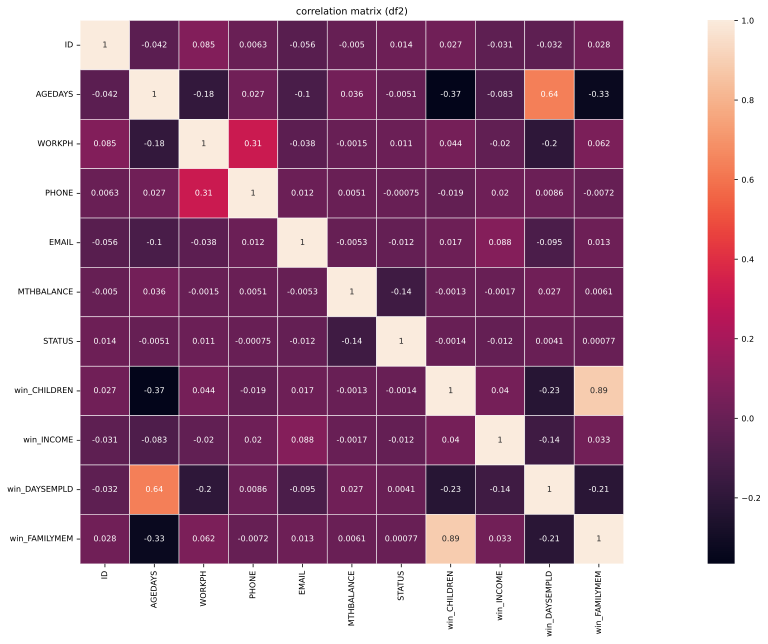

In [105]:
# Draw the heat map using seaborn

corrmat_df2 = df2.corr()

plt.figure(figsize=(30,10))
sns.heatmap(corrmat_df2, square=True, annot=True, linewidths=0.5)
plt.title("correlation matrix (df2)")

plt.show()

In [106]:
# Higher correlation between Children & Family member so drop one

df2= df2.drop(columns=['win_FAMILYMEM'])

In [107]:
df3 = df2.copy()

In [108]:
df3= df3.drop(columns=['STATUS','ID']) # (changed to risk)

In [109]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 777715 entries, 0 to 777714
Data columns (total 17 columns):
 #   Column         Non-Null Count   Dtype   
---  ------         --------------   -----   
 0   GENDER         777715 non-null  object  
 1   OWNCAR         777715 non-null  object  
 2   OWNREALTY      777715 non-null  object  
 3   INCOMETYPE     777715 non-null  object  
 4   EDUCATION      777715 non-null  object  
 5   FAMILYSTATUS   777715 non-null  object  
 6   HOUSINGTYPE    777715 non-null  object  
 7   AGEDAYS        777715 non-null  int64   
 8   WORKPH         777715 non-null  int64   
 9   PHONE          777715 non-null  int64   
 10  EMAIL          777715 non-null  int64   
 11  OCCUPATION     777715 non-null  object  
 12  MTHBALANCE     777715 non-null  int64   
 13  risk           777715 non-null  category
 14  win_CHILDREN   777715 non-null  int64   
 15  win_INCOME     777715 non-null  float64 
 16  win_DAYSEMPLD  777715 non-null  int64   
dtypes: categor

## Data preparation for modeling

#### Now, first split data into feature set and target (X,y)

In [110]:
# `y` is the target variable (what you are trying to predict)
y = df3['risk']

# `X` is the feature set that you are using to predict
X = df3.drop(['risk'],axis=1)  # keeping only independent features in the X matrix

In [111]:
print(f'There are {df3.shape[0]} rows and {df3.shape[1]} columns in the dataset df3.')
print(f'There are {X.shape[0]} rows and {X.shape[1]} columns in the dataset X, i.e., the independent variables.')


There are 777715 rows and 17 columns in the dataset df3.
There are 777715 rows and 16 columns in the dataset X, i.e., the independent variables.


In [112]:
X = pd.get_dummies(X, drop_first=True)    # make dummies i.e., one hot encoding of the categorical variables

####  Now lets split the data into train and test sets where 20% of the data resides in the test set.

In [113]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 465)

print(X_train.shape, X_test.shape)

(622172, 46) (155543, 46)


In [114]:
# describes info about train and test set
print("X_train dataset: ", X_train.shape)
print("y_train dataset: ", y_train.shape)
print("X_test dataset: ", X_test.shape)
print("y_test dataset: ", y_test.shape)

X_train dataset:  (622172, 46)
y_train dataset:  (622172,)
X_test dataset:  (155543, 46)
y_test dataset:  (155543,)


In [115]:
# Lets check the target again
print(y.value_counts())
print(y.value_counts(1))

0    774887
1      2828
Name: risk, dtype: int64
0    0.996364
1    0.003636
Name: risk, dtype: float64


In [116]:
print(y_test.value_counts())
y_test.value_counts(1)

0    154971
1       572
Name: risk, dtype: int64


0    0.996323
1    0.003677
Name: risk, dtype: float64

## Dealing with Unbalanced Data

* The data is imbalanced.so, we have to do either under sampling or over sampling. We will do over sampling because we will loose our data in under sampling.

In [117]:
# import SMOTE module from imblearn library
# pip install imblearn (if you don't have imblearn in your system)
from imblearn.over_sampling import SMOTE


In [118]:
sm = SMOTE(random_state = 2)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [119]:
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0)))

Before OverSampling, counts of label '1': 2256
Before OverSampling, counts of label '0': 619916 



In [120]:
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

After OverSampling, the shape of train_X: (1239832, 46)
After OverSampling, the shape of train_y: (1239832,) 

After OverSampling, counts of label '1': 619916
After OverSampling, counts of label '0': 619916


In [121]:
X_train_res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1239832 entries, 0 to 1239831
Data columns (total 46 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   AGEDAYS                           1239832 non-null  int64  
 1   WORKPH                            1239832 non-null  int64  
 2   PHONE                             1239832 non-null  int64  
 3   EMAIL                             1239832 non-null  int64  
 4   MTHBALANCE                        1239832 non-null  int64  
 5   win_CHILDREN                      1239832 non-null  int64  
 6   win_INCOME                        1239832 non-null  float64
 7   win_DAYSEMPLD                     1239832 non-null  int64  
 8   GENDER_M                          1239832 non-null  uint8  
 9   OWNCAR_Y                          1239832 non-null  uint8  
 10  OWNREALTY_Y                       1239832 non-null  uint8  
 11  INCOMETYPE_Pensioner              123

In [122]:
y_train_res.info()

<class 'pandas.core.series.Series'>
RangeIndex: 1239832 entries, 0 to 1239831
Series name: risk
Non-Null Count    Dtype   
--------------    -----   
1239832 non-null  category
dtypes: category(1)
memory usage: 1.2 MB


In [123]:
y_train_res.head()

0    0
1    0
2    0
3    0
4    0
Name: risk, dtype: category
Categories (2, int64): [0, 1]

In [124]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

In [125]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, annot_kws={"fontsize": 12}, fmt="")
    plt.ylabel("True label", {"fontsize": 10})
    plt.xlabel("Predicted label", {"fontsize": 10})

## Build Models
**Performance measures of the models**
* We will use Accuracy, Recall, Precision and F1 score, in addition to the confusion matrix to evaluate the models.
    * Accuracy - Accuracy is the percentage of correct classifications that a ML model achieves. Accuracy = TP+TN/(TP+TN+FP+FN)
    * Recall (Sensitivity) - Recall is the ratio of correctly predicted positive observations to the all observations in actual class certified, i.e., of all the actually risk=1 cases, how many did we predict? Recall = TP/TP+FN
    * Precision is the ratio of correctly predicted positive observations to the total predicted positive observations, i.e., of all the cases that we predicted as risk=1, how many were actually 1?. Precision = TP/TP+FP
    * F1 Score is the weighted average of Precision and Recall. Therefore, this considers both false positives and false negatives as well. F1 Score = 2*(Recall * Precision) / (Recall + Precision)

**However, most emphasis will be given to the recall, most number of risk='1' identified, followed by F1 score (because it balances both recall and precision) and the confusion matrix.**
**We will choose our model also based on NOT/LOW overfitting of the training data** 
    
## 1.0. Logistic Regression model

#### Performed logistic regression classification on the dataset before balancing to check its performance

In [126]:
lr1 = LogisticRegression()
lr1.fit(X_train, y_train)

print('accuracy score: %s' % lr1.score(X_test, y_test))
print('# of iterations %s' % lr1.n_iter_[0])

accuracy score: 0.9963225603209402
# of iterations 22


Training performance 
    Accuracy  Recall  Precision   F1
0  0.996374     0.0        0.0  0.0
Testing performance 
    Accuracy  Recall  Precision   F1
0  0.996323     0.0        0.0  0.0


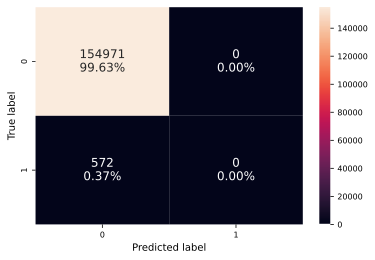

In [127]:
lr1_model_train_perf=model_performance_classification_sklearn(lr1, X_train, y_train)
print("Training performance \n",lr1_model_train_perf)

lr1_model_test_perf=model_performance_classification_sklearn(lr1, X_test, y_test)
print("Testing performance \n",lr1_model_test_perf)

confusion_matrix_sklearn(lr1, X_test, y_test)

* The data is highly imbalanced so it is not able to estimate Recall and Precison because the TP is only a small fraction of the entire data. 
* Accuracy is also 99% indicating its biased. 
* Hence we have to use the balanced datatset which we created earlier.

## Modelling with the balanced dataset

In [128]:
lr2 = LogisticRegression()
lr2.fit(X_train_res, y_train_res)

print('accuracy score: %s' % lr2.score(X_test, y_test))
print('# of iterations %s' % lr2.n_iter_[0])

accuracy score: 0.39376249654436396
# of iterations 25


Training performance 
    Accuracy   Recall  Precision        F1
0  0.522932  0.65203   0.518226  0.577479
Testing performance 
    Accuracy    Recall  Precision        F1
0  0.393762  0.624126    0.00378  0.007515


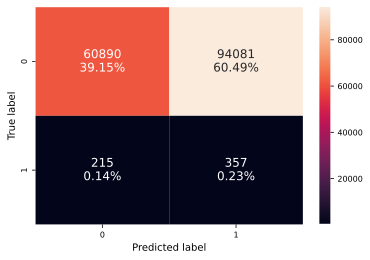

In [129]:
lr2_model_train_perf=model_performance_classification_sklearn(lr2, X_train_res, y_train_res)
print("Training performance \n",lr2_model_train_perf)

lr2_model_test_perf=model_performance_classification_sklearn(lr2, X_test, y_test)
print("Testing performance \n",lr2_model_test_perf)

confusion_matrix_sklearn(lr2, X_test, y_test)

## 2.0. Decision Tree model

In [130]:
# This is the model that you'll be using
from sklearn import tree


# Initialize and train the tree
decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy', # Decision tree uses 'entropy' or 'gini' selection criteria to split the data
    max_features=3, # max_features: The number of features to consider when looking for the best split. If this value is not set, the decision tree will consider all features available to make the best split.
    max_depth=3,
    random_state = 1337
)
decision_tree.fit(X_train_res, y_train_res)

DecisionTreeClassifier(criterion='entropy', max_depth=3, max_features=3,
                       random_state=1337)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.546709  0.303436   0.590969  0.400985
Testing performance 
    Accuracy    Recall  Precision        F1
0  0.789299  0.307692   0.005407  0.010626


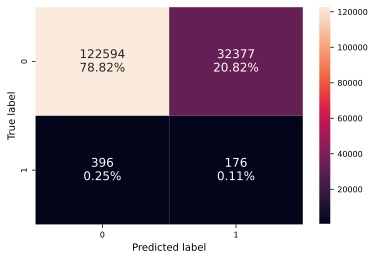

In [131]:
dtree_model_train_perf=model_performance_classification_sklearn(decision_tree, X_train_res, y_train_res)
print("Training performance \n",dtree_model_train_perf)

dtree_model_test_perf=model_performance_classification_sklearn(decision_tree, X_test, y_test)
print("Testing performance \n",dtree_model_test_perf)

confusion_matrix_sklearn(decision_tree, X_test, y_test)

## 3.0. Random Forest

In [132]:
rf = RandomForestClassifier(n_estimators=250,
                              max_depth=12,
                              min_samples_leaf=16
                              )
rf.fit(X_train_res,y_train_res)

RandomForestClassifier(max_depth=12, min_samples_leaf=16, n_estimators=250)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.952819  0.934667   0.969878  0.951947
Testing performance 
    Accuracy    Recall  Precision        F1
0  0.971223  0.802448   0.095189  0.170189


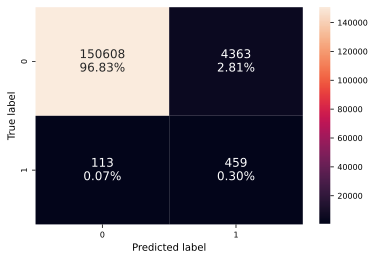

In [133]:
rf_model_train_perf=model_performance_classification_sklearn(rf,X_train_res,y_train_res)
print("Training performance \n",rf_model_train_perf)

rf_model_test_perf=model_performance_classification_sklearn(rf,X_test,y_test)
print("Testing performance \n",rf_model_test_perf)

confusion_matrix_sklearn(rf,X_test,y_test)

#####  Accuracy is better in the testing model but the recall in training is higher than testing perofrmance. It is overfitting some data (some risky population is getting interpreted as not risky)

### Tuning Random Forest

In [135]:
# Choose the type of classifier. 
rf_estimator = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {  
        "n_estimators": [75,150],
        "min_samples_leaf": np.arange(5,100,30),
        "max_features": [0.7,'log2','auto'],
        "max_samples": [0.5, None],
}

# Run the grid search
grid_obj = GridSearchCV(rf_estimator, parameters, scoring='recall',cv=3)
grid_obj = grid_obj.fit(X_train_res, y_train_res)

# Set the clf to the best combination of parameters
rf_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
rf_estimator.fit(X_train_res, y_train_res)

RandomForestClassifier(max_samples=0.5, min_samples_leaf=5, n_estimators=150,
                       random_state=1)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.993853  0.999461   0.988376  0.993887
Testing performance 
    Accuracy    Recall  Precision        F1
0  0.987585  0.811189   0.202886  0.324589


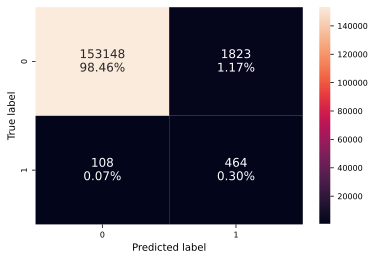

In [136]:
rf_estimator_model_train_perf=model_performance_classification_sklearn(rf_estimator, X_train_res,y_train_res)
print("Training performance \n",rf_estimator_model_train_perf)

rf_estimator_model_test_perf=model_performance_classification_sklearn(rf_estimator, X_test, y_test)
print("Testing performance \n",rf_estimator_model_test_perf)

confusion_matrix_sklearn(rf_estimator, X_test,y_test)

### 4.0. Gradient Boosting Classifier

Training performance:
    Accuracy    Recall  Precision       F1
0  0.849434  0.852743   0.847136  0.84993
Testing performance:
    Accuracy    Recall  Precision       F1
0  0.846705  0.723776   0.017178  0.03356


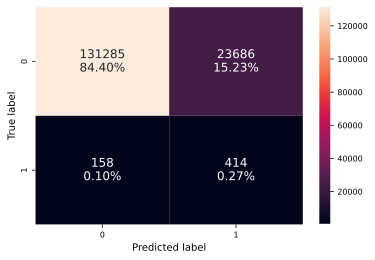

In [137]:
#Fitting the model
gb_classifier = GradientBoostingClassifier(random_state=1)
gb_classifier.fit(X_train_res,y_train_res)

#Calculating different metrics
gb_classifier_model_train_perf=model_performance_classification_sklearn(gb_classifier,X_train_res,y_train_res)
print("Training performance:\n",gb_classifier_model_train_perf)
gb_classifier_model_test_perf=model_performance_classification_sklearn(gb_classifier,X_test,y_test)
print("Testing performance:\n",gb_classifier_model_test_perf)

#Creating confusion matrix
confusion_matrix_sklearn(gb_classifier,X_test,y_test)

### Tuning Gradient Boost

In [138]:
# To be used for tuning the model
from sklearn.model_selection import RandomizedSearchCV

In [139]:
%%time

# defining model 
model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomizedSearchCV
param_grid = { "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)], "n_estimators": np.arange(75,200,25), "learning_rate": [0.2, 0.03, 0.05, 1], "subsample":[0.3, 0.5, 0.7, 1], "max_features":[0.3, 0.5, 0.7, 1]}

#Calling RandomizedSearchCV
GBM_tuned_O = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=20, scoring='recall', cv=3, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
GBM_tuned_O.fit(X_train_res,y_train_res)

print("Best parameters are {} with CV score={}:" .format(GBM_tuned_O.best_params_, GBM_tuned_O.best_score_))

Best parameters are {'subsample': 0.3, 'n_estimators': 150, 'max_features': 0.5, 'learning_rate': 0.05, 'init': DecisionTreeClassifier(random_state=1)} with CV score=0.9987014377911575:
CPU times: total: 1min 16s
Wall time: 15min 58s


In [140]:
GBM_tuned_O = GradientBoostingClassifier(
    random_state=1,
    subsample=0.7,
    n_estimators=75,
    max_features=1,
    learning_rate=1,
    init=DecisionTreeClassifier(random_state=1),
       
)
# Fit the model on training data
GBM_tuned_O.fit(X_train_res, y_train_res)

GradientBoostingClassifier(init=DecisionTreeClassifier(random_state=1),
                           learning_rate=1, max_features=1, n_estimators=75,
                           random_state=1, subsample=0.7)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.994581  0.999532   0.989731  0.994607

Validation performance 
    Accuracy   Recall  Precision        F1
0   0.98844  0.76049   0.207538  0.326087

Validation Confusion Matrix


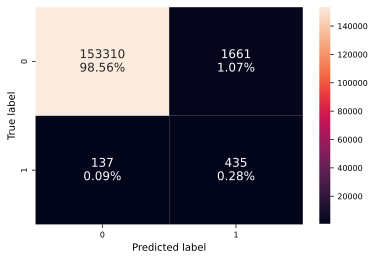

In [141]:
GBM_random_train_perf_O=model_performance_classification_sklearn(GBM_tuned_O,X_train_res,y_train_res)
print("Training performance \n",GBM_random_train_perf_O)
print("")

GBM_random_val_perf_O=model_performance_classification_sklearn(GBM_tuned_O,X_test,y_test)
print("Validation performance \n",GBM_random_val_perf_O)
print("")

print("Validation Confusion Matrix")
confusion_matrix_sklearn(GBM_tuned_O,X_test,y_test)

## Model Performance Comparison and Conclusions

In [142]:
# training performance comparison

models_train_comp_df = pd.concat(
    [lr2_model_train_perf.T, 
     dtree_model_train_perf.T, 
     rf_model_train_perf.T, 
     rf_estimator_model_train_perf.T,
     gb_classifier_model_train_perf.T,
     GBM_random_train_perf_O.T,
     ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression",
    "Decision Tree",
    "Random Forest",
    "Random Forest Tuned",
    "Gradient Boost Classifier",
    "Gradient Boost Classifier Tuned",
    ]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression,Decision Tree,Random Forest,Random Forest Tuned,Gradient Boost Classifier,Gradient Boost Classifier Tuned
Accuracy,0.522932,0.546709,0.952819,0.993853,0.849434,0.994581
Recall,0.652030,0.303436,0.934667,0.999461,0.852743,0.999532
Precision,0.518226,0.590969,0.969878,0.988376,0.847136,0.989731
F1,0.577479,0.400985,0.951947,0.993887,0.849930,0.994607


In [143]:
# validation performance comparison

models_test_comp_df = pd.concat(
    [
        lr2_model_test_perf.T,
        dtree_model_test_perf.T,
        rf_model_test_perf.T,
        rf_estimator_model_test_perf.T,
        gb_classifier_model_test_perf.T,
        GBM_random_val_perf_O.T
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression",
    "Decision Tree",
    "Random Forest",
    "Random Forest Tuned",
    "Gradient Boost Classifier",
    "Gradient Boost Classifier Tuned"
]
print("Testing performance comparison: \n")
models_test_comp_df

Testing performance comparison: 



,Logistic Regression,Decision Tree,Random Forest,Random Forest Tuned,Gradient Boost Classifier,Gradient Boost Classifier Tuned
Accuracy,0.393762,0.789299,0.971223,0.987585,0.846705,0.988440
Recall,0.624126,0.307692,0.802448,0.811189,0.723776,0.760490
Precision,0.003780,0.005407,0.095189,0.202886,0.017178,0.207538
F1,0.007515,0.010626,0.170189,0.324589,0.033560,0.326087


####  Balancing the test data: Model comparison between the training and testing dataset shows the precison to be too low in the testing dataset, so we have to balance the test data to compare the models and choose the best model to fit the purpose.

In [144]:
sm = SMOTE(random_state = 2)
X_test_res, y_test_res = sm.fit_resample(X_test, y_test)
print("Before OverSampling, counts of label '1': {}".format(sum(y_test == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_test == 0)))


Before OverSampling, counts of label '1': 572
Before OverSampling, counts of label '0': 154971 



In [145]:
X_test_res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309942 entries, 0 to 309941
Data columns (total 46 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   AGEDAYS                           309942 non-null  int64  
 1   WORKPH                            309942 non-null  int64  
 2   PHONE                             309942 non-null  int64  
 3   EMAIL                             309942 non-null  int64  
 4   MTHBALANCE                        309942 non-null  int64  
 5   win_CHILDREN                      309942 non-null  int64  
 6   win_INCOME                        309942 non-null  float64
 7   win_DAYSEMPLD                     309942 non-null  int64  
 8   GENDER_M                          309942 non-null  uint8  
 9   OWNCAR_Y                          309942 non-null  uint8  
 10  OWNREALTY_Y                       309942 non-null  uint8  
 11  INCOMETYPE_Pensioner              309942 non-null  u

In [146]:
y_test_res.info()

<class 'pandas.core.series.Series'>
RangeIndex: 309942 entries, 0 to 309941
Series name: risk
Non-Null Count   Dtype   
--------------   -----   
309942 non-null  category
dtypes: category(1)
memory usage: 302.9 KB


### Model comparison using balanced training and test dataset.

Training performance 
    Accuracy   Recall  Precision        F1
0  0.522932  0.65203   0.518226  0.577479
Testing performance 
    Accuracy   Recall  Precision        F1
0  0.510531  0.62815   0.508525  0.562043


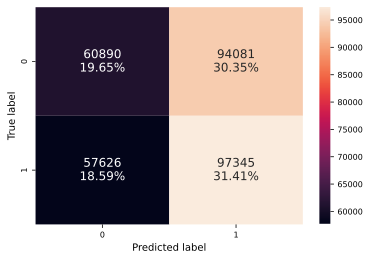

In [147]:
lr2_model_train_perf=model_performance_classification_sklearn(lr2, X_train_res, y_train_res)
print("Training performance \n",lr2_model_train_perf)

lr2_model_test_res_perf=model_performance_classification_sklearn(lr2, X_test_res, y_test_res)
print("Testing performance \n",lr2_model_test_res_perf)

confusion_matrix_sklearn(lr2, X_test_res, y_test_res)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.546709  0.303436   0.590969  0.400985
Testing performance 
    Accuracy    Recall  Precision        F1
0  0.560515  0.329952   0.612298  0.428822


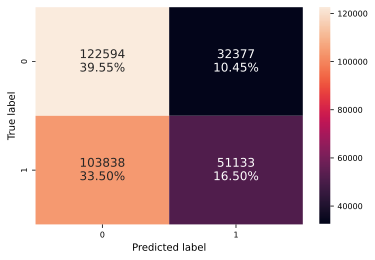

In [148]:
dtree_model_train_perf=model_performance_classification_sklearn(decision_tree, X_train_res, y_train_res)
print("Training performance \n",dtree_model_train_perf)

dtree_model_test_res_perf=model_performance_classification_sklearn(decision_tree, X_test_res, y_test_res)
print("Testing performance \n",dtree_model_test_res_perf)

confusion_matrix_sklearn(decision_tree, X_test_res, y_test_res)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.952819  0.934667   0.969878  0.951947
Testing performance 
    Accuracy    Recall  Precision        F1
0  0.918265  0.864684   0.968467  0.913638


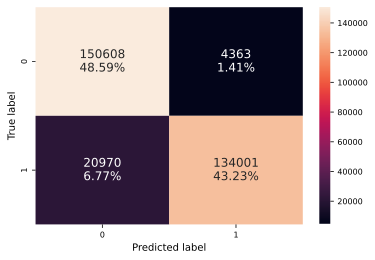

In [149]:
rf_model_train_perf=model_performance_classification_sklearn(rf,X_train_res,y_train_res)
print("Training performance \n",rf_model_train_perf)

rf_model_test_res_perf=model_performance_classification_sklearn(rf,X_test_res,y_test_res)
print("Testing performance \n",rf_model_test_res_perf)

confusion_matrix_sklearn(rf,X_test_res,y_test_res)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.993853  0.999461   0.988376  0.993887
Testing performance 
    Accuracy    Recall  Precision        F1
0  0.922524  0.856812   0.986457  0.917075


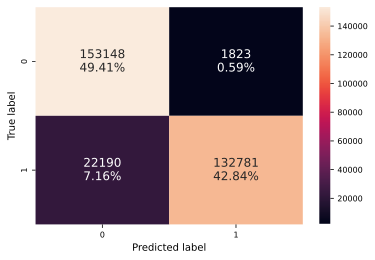

In [150]:
rf_estimator_model_train_perf=model_performance_classification_sklearn(rf_estimator, X_train_res,y_train_res)
print("Training performance \n",rf_estimator_model_train_perf)

rf_estimator_model_test_res_perf=model_performance_classification_sklearn(rf_estimator, X_test_res, y_test_res)
print("Testing performance \n",rf_estimator_model_test_res_perf)

confusion_matrix_sklearn(rf_estimator, X_test_res,y_test_res)

Training performance:
    Accuracy    Recall  Precision       F1
0  0.849434  0.852743   0.847136  0.84993
Testing performance:
    Accuracy    Recall  Precision        F1
0  0.862936  0.878713   0.851834  0.865065


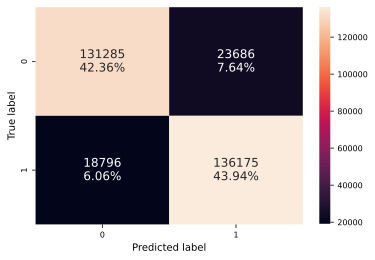

In [151]:
gb_classifier_model_train_perf=model_performance_classification_sklearn(gb_classifier,X_train_res,y_train_res)
print("Training performance:\n",gb_classifier_model_train_perf)

gb_classifier_model_test_res_perf=model_performance_classification_sklearn(gb_classifier,X_test_res,y_test_res)
print("Testing performance:\n",gb_classifier_model_test_res_perf)

#Creating confusion matrix
confusion_matrix_sklearn(gb_classifier,X_test_res,y_test_res)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.994581  0.999532   0.989731  0.994607

Validation performance 
    Accuracy    Recall  Precision        F1
0  0.895529  0.801776   0.986808  0.884721

Validation Confusion Matrix


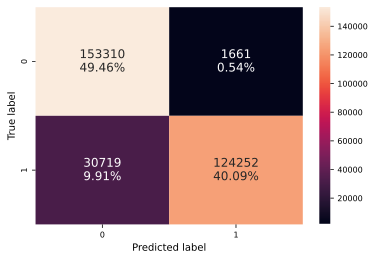

In [152]:
GBM_random_train_perf_O=model_performance_classification_sklearn(GBM_tuned_O,X_train_res,y_train_res)
print("Training performance \n",GBM_random_train_perf_O)
print("")

GBM_random_val_res_perf_O=model_performance_classification_sklearn(GBM_tuned_O, X_test_res,y_test_res)
print("Validation performance \n",GBM_random_val_res_perf_O)
print("")

print("Validation Confusion Matrix")
confusion_matrix_sklearn(GBM_tuned_O,X_test_res,y_test_res)

In [153]:
# training performance comparison

models_train_comp_df = pd.concat(
    [lr2_model_train_perf.T, 
     dtree_model_train_perf.T, 
     rf_model_train_perf.T, 
     rf_estimator_model_train_perf.T,
     gb_classifier_model_train_perf.T,
     GBM_random_train_perf_O.T,
     ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression",
    "Decision Tree",
    "Random Forest",
    "Random Forest Tuned",
    "Gradient Boost Classifier",
    "Gradient Boost Classifier Tuned",
    ]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression,Decision Tree,Random Forest,Random Forest Tuned,Gradient Boost Classifier,Gradient Boost Classifier Tuned
Accuracy,0.522932,0.546709,0.952819,0.993853,0.849434,0.994581
Recall,0.652030,0.303436,0.934667,0.999461,0.852743,0.999532
Precision,0.518226,0.590969,0.969878,0.988376,0.847136,0.989731
F1,0.577479,0.400985,0.951947,0.993887,0.849930,0.994607


In [154]:
# validation performance comparison

models_test_comp_df = pd.concat(
    [
        lr2_model_test_res_perf.T,
        dtree_model_test_res_perf.T,
        rf_model_test_res_perf.T,
        rf_estimator_model_test_res_perf.T,
        gb_classifier_model_test_res_perf.T,
        GBM_random_val_res_perf_O.T
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression",
    "Decision Tree",
    "Random Forest",
    "Random Forest Tuned",
    "Gradient Boost Classifier",
    "Gradient Boost Classifier Tuned"
]
print("Testing performance comparison: \n")
models_test_comp_df

Testing performance comparison: 



,Logistic Regression,Decision Tree,Random Forest,Random Forest Tuned,Gradient Boost Classifier,Gradient Boost Classifier Tuned
Accuracy,0.510531,0.560515,0.918265,0.922524,0.862936,0.895529
Recall,0.628150,0.329952,0.864684,0.856812,0.878713,0.801776
Precision,0.508525,0.612298,0.968467,0.986457,0.851834,0.986808
F1,0.562043,0.428822,0.913638,0.917075,0.865065,0.884721


### Model selection:
* Performances were checked with various parameters:
     Reduced overfitting of training data over testing data
     Highest performance metrics, 
     and also the confusion matrices. 
* Highest emphasis was placed on the Recall as the identification of the certified cases (i.e., 1) is of prime importance.

* Best performance was delivered by Gradient Boost classifier, closely followed by Random forest classifier model. 
    Gradient Boost delivered highest Recall (0.88), F1-score (0.87), and accuracy (0.86) and precision (0.87).
    In addition, Gradient Boost was able  to identify the highest number of risky applicants (most important for this project) in the test set (i.e., 43.94%) and reduced false negatives

## Feature Importance

FEATURE IMPORTANCE OF RANDOM FOREST MODEL


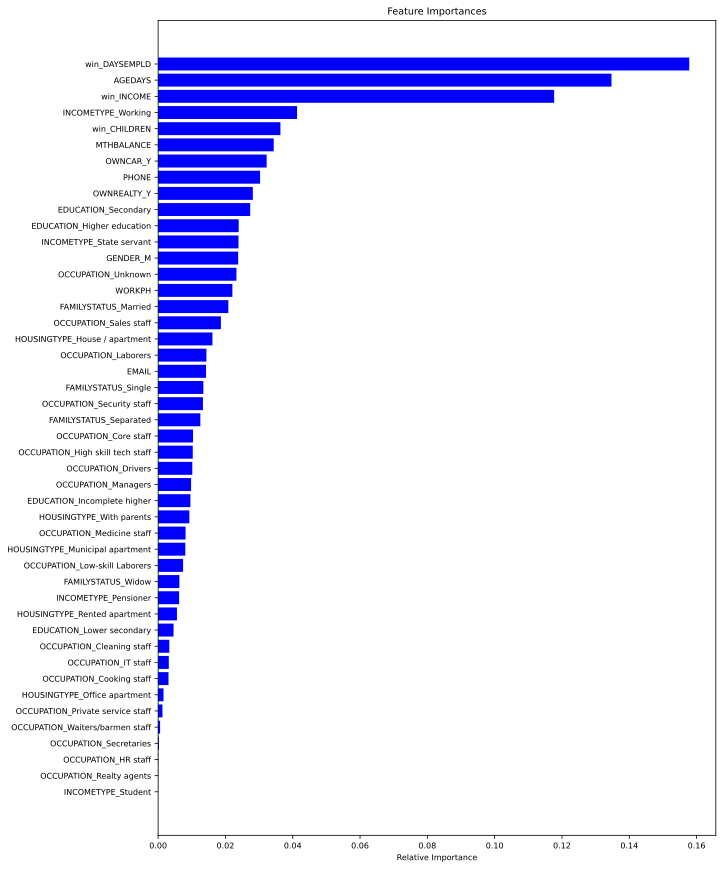

In [155]:
# For Random Forest

print('FEATURE IMPORTANCE OF RANDOM FOREST MODEL')

features = X_train_res.columns
importances = rf.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10, 15))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="Blue", align="center")
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

FEATURE IMPORTANCE OF GRADIENT BOOST MODEL


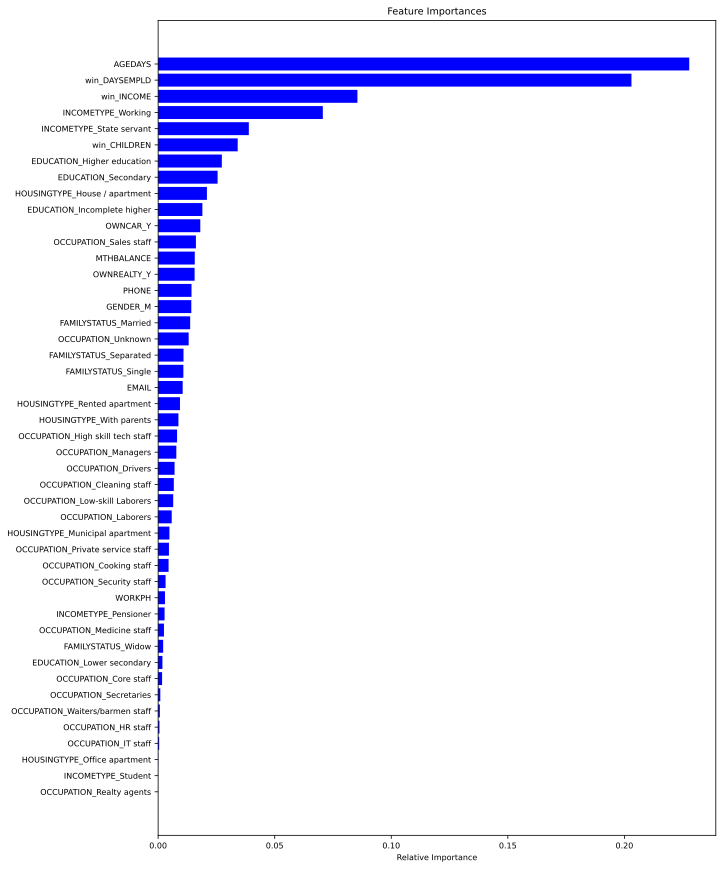

In [156]:
# For Gradient Boosting

print('FEATURE IMPORTANCE OF GRADIENT BOOST MODEL')

features = X_train_res.columns
importances = gb_classifier.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10, 15))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="Blue", align="center")
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

### Key factors impacting the model

* Gradient Boost and Random forest are the two highest performers.

* Therefore, feature importance from GB is plotted to show which independent variables became deciding factors in this classification model.

* Accordingly, the key factors are
    * Applicants age
    * Days of employment
    * Total income


## SUMMARY

* A large dataset of credit card applicants was analyzed. The task was to create a machine learning model to predict if an applicant is at high risk for default.
* Explanatory analysis was done to understand the dataset. It is an unbalanced data so that was taken into consideration (SMOTE) .
    * ‘Risk’ feature was created based on the ‘status’, i.e., days past due.
    * Correlation of the risk was observed with (1) overdue in months, (2) age of applicant in days, (3) total income and (4) days of employment  
* The dataset was divided into training and test data set for validation. 
* Models were built using ML classifiers (Logistic regression, Decision tree, Random Forest and Gradient Boosting).
* Performance metrics of the models were estimated with the help of confusion matrix. 
* Gradient boosting and Random forest both fitted well with the model.
    * In Gradient Boosting validation Accuracy is 0.86, Recall is 0.87 , Precision is 0.85 , and FI score is 0.87
    * In RF, validation Accuracy is 0.92 , Recall is 0.87 , Precision is 0.97 , and FI score is 0.91
* Validation performance comparison shows that the Gradient boosting classifier to be a better predictor for the risk =1 category.
* The key factors that contributed towards both models are 
    * Age of an applicant
    * Days of employment
    * Total income


## CONCLUSION:
* Several good models have been developed with the help of analytical observations, model tuning and performance evaluations. 
* ‘Gradient Boost classifier’ has been chosen for its best performance. A very close contender was the ‘Random Forest classifier’. GB has been chosen because it has identified maximum number of risked candidates, which is the primary goal of this project. 
* High fidelity of the top performing models on the testing dataset shows that these can be used to select suitable applicants from large number of credit card applications. 
* However, the most critical assumption in all analysis and modeling prediction is that the past data represents how the future cases will behave. 
* The key factors in deciding the classifications are: 
    * Days of employment
    * Applicants age
    * Total income

## Recommendations:
* Utilize the model(s) to predict risk and chance of credit card approval. However, realize that model has its uncertainties, so, quick review of the results will be necessary for specific categorized applicants. 
* Update the model with new data to check if that impacts the outlier, or the input features. 
* Collect accurate data in days employed
